In [ ]:
from huggingface_hub import login

login('hugging_face_token')

In [12]:
import torch
# Move model to the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# load model and processor

In [2]:
# from transformers import LlavaNextVideoProcessor, LlavaNextVideoForConditionalGeneration
from transformers import VideoLlavaProcessor, VideoLlavaForConditionalGeneration
from PIL import Image
import requests
# from torchvision import io
from typing import Dict
from transformers import AutoProcessor, BitsAndBytesConfig

# model_name = 'llava-hf/LLaVA-NeXT-Video-7B-hf'
model_name = 'LanguageBind/Video-LLaVA-7B-hf'

processor = VideoLlavaProcessor.from_pretrained(model_name)

The model weights are not tied. Please use the `tie_weights` method before using the `infer_auto_device` function.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [ ]:
quantization_config = BitsAndBytesConfig(load_in_4bit=True, 
                                bnb_4bit_quant_type="nf4", # 4 bit for qLoRA
                                bnb_4bit_use_double_quant=True, # for better accuracy
                                bnb_4bit_compute_dtype=torch.float16) # speedup computation, Use float16 instead of bfloat16 for better compatibility

model = VideoLlavaForConditionalGeneration.from_pretrained(model_name, 
    quantization_config=quantization_config,
    torch_dtype=torch.float16,# bfloat16 use for CPU or NPU
    _attn_implementation="flash_attention_2",
    device_map="auto")

In [3]:
from peft import LoraConfig, get_peft_model

# Use LoRA (Low-Rank Adaptation) via PEFT
lora_config = LoraConfig(
    r=8,         # Rank of the low-rank decomposition
    lora_alpha=16,  # Scaling factor for LoRA
    lora_dropout=0.1,  # Dropout for LoRA layers
    target_modules=["q_proj", "k_proj", "v_proj", "o_proj"],  # Target layers to apply LoRA to (e.g., attention layers)
    bias="none",  # Whether to add bias terms
    task_type="CAUSAL_LM"  # Task type (can vary based on your use case)
)

# Apply PEFT to the model
peft_model = get_peft_model(model, lora_config)
peft_model.to(device)
peft_model.print_trainable_parameters()

trainable params: 10,747,904 || all params: 7,377,027,072 || trainable%: 0.1457


# make dataset

In [7]:
import pandas as pd
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset
from PIL import Image

df = pd.read_csv('training_df.csv')
df = df.drop('Descriptive Meaning by ChatGPT', axis=1)
df['img_path'] = ''
for i in range(len(df)):
    df.loc[i,'img_path'] = 'hindi_img/'+str(i)+'.png'
df.head()

,Actual Proverb,Final_Human_Annotation,img_path
0,अधजल गगरी छलकत जाय।,"The Hindi proverb ""अधजल गगरी छलकत जाय"" transla...",hindi_img/0.png
1,अपने मुँह मियाँ मिट्ठू बनाना।,"The Hindi proverb ""अपने मुँह मियाँ मिट्ठू बना...",hindi_img/1.png
2,अपने हाथ में अपना भाग्य होना।,To create a clear and highly specific visualiz...,hindi_img/2.png
3,अपना उल्लू सीधा करना।,"The Hindi proverb ""अपना उल्लू सीधा करना"" trans...",hindi_img/3.png
4,अँगारे बरसना,Certainly! Here is a revised version with a cl...,hindi_img/4.png


In [8]:
# Split the dataset into train, validation, and test (80/10/10 split)
temp_df, test_df = train_test_split(df, test_size=0.2, random_state=42)
train_df, val_df = train_test_split(temp_df, test_size=0.2, random_state=42)

train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

train_df.shape, val_df.shape, test_df.shape

((816, 3), (205, 3), (256, 3))

## play with processor

In [ ]:
# system_prompt = """You are expert about Proverbs.
# The user is shown an image inspired by a proverb from either Indian or Thai culture. 
# The goal is to generate a caption that interprets the image in relation to the proverb's message. 
# The caption should capture literal elements, such as people, objects, or landscapes, as well as connect these to the cultural or metaphorical meaning of the proverb. 
# Focus on conveying the message and values symbolized in the proverb, while noting any details unique to Indian or Thai culture."""
        
# user_prompt = """You are shown an image related to a proverb from either India or Thailand. 
# Look closely at the visual details and describe the image in a way that captures both its literal elements and the deeper meaning related to the proverb. 
# Be sure to connect any cultural symbols, setting, or actions in the image to the values and themes of the proverb"""

# conversation = [
#     {
#         "role": "system",
#         "content": [
#             {"type": "text", "text": system_prompt},
#             ],
#     },
#     {
#         "role": "user",
#         "content": [
#             {"type": "text", "text": user_prompt},
#             {"type": "image", "image": test_df.loc[0, 'img_path']},
#             ],
#     },
#     {
#         "role": "assistant",
#         "content": [{"type": "text", "text": test_df.loc[0, 'meaning_from_chat']},]
#     },
# ]

# text_prompt = processor.apply_chat_template(conversation, add_generation_prompt=True)

# # Note that the template simply formats your prompt, you still have to tokenize it and obtain pixel values for your visuals
# print(text_prompt)

In [9]:
from PIL import Image

def resize_with_aspect_ratio(image, width=None, height=None):
    # Get the original image dimensions
    # h, w = image.shape[:2]
    w, h = image.size 
    # Calculate the aspect ratio
    aspect_ratio = w / h

    if width is None:
        # Calculate height based on the specified width
        new_height = int(height / aspect_ratio)
        # resized_image = cv2.resize(image, (height, new_height))
        resized_image = image.resize((height, new_height))
    else:
        # Calculate width based on the specified height
        new_width = int(width * aspect_ratio)
        # resized_image = cv2.resize(image, (new_width, width))
        resized_image = image.resize((width, new_width))

    return resized_image

In [10]:
texts_inputs = f"""SYSTEM: 
{system_prompt}
USER: <image>
{user_prompt}
ASSISTANT: 
{test_df.loc[0, 'meaning_from_chat']}"""

image_input = Image.open(test_df.loc[0, 'img_path'])
image_input = resize_with_aspect_ratio(image_input,360)
image_input.size

(360, 360)

In [15]:
inputs = processor(text=texts_inputs, images=image_input, return_tensors="pt", padding="max_length", max_length=512, truncation=True)
inputs.input_ids, inputs.keys()

(tensor([[    1, 28962,  1254, 12665, 29901, 29871,    13,  3492,   526, 17924,
           1048,  1019,   369,  5824, 29889,    13,  1576,  1404,   338,  4318,
            385,  1967, 20603,   491,   263,   410, 18248,   515,  2845,  7560,
            470,   498,  1794,  9257, 29889, 29871,    13,  1576,  7306,   338,
            304,  5706,   263,  5777,   683,   393,  5133,  1372,   278,  1967,
            297,  8220,   304,   278,   410, 18248, 29915, 29879,  2643, 29889,
          29871,    13,  1576,  5777,   683,   881, 10446, 16333,  3161, 29892,
           1316,   408,  2305, 29892,  3618, 29892,   470,  2982,  1557, 11603,
          29892,   408,  1532,   408,  4511,  1438,   304,   278, 16375,   470,
           1539,   481,  2015,   936,  6593,   310,   278,   410, 18248, 29889,
          29871,    13, 20560,   373,   378,   345,  5414,   278,  2643,   322,
           1819,  5829,  1891,   297,   278,   410, 18248, 29892,  1550,   451,
            292,   738,  4902,  5412,   

In [ ]:
processor.batch_decode(inputs.input_ids)

In [23]:
for i in inputs.input_ids[0]:
    wod = processor.decode(i)
    if wod in ['ASS','IST','ANT',':']:
        print(wod, i)

: tensor(29901)
: tensor(29901)
ASS tensor(22933)
IST tensor(9047)
ANT tensor(13566)
: tensor(29901)


In [ ]:
import torch

def find_assistant_content_sublist_indexes(l):
    start_indexes = []
    end_indexes = []

    # Iterate through the list to find starting points
    for i in range(len(l)):
        # Check if the current and next element form the start sequence
        
        if l[i] == 22933 and l[i + 1] == 9047 and l[i + 2] == 13566 and l[i + 3] == 29901: # ASS|IST|ANT|:
            start_indexes.append(i+4)
            for j in range(i + 4, len(l)):
                # if l[j] == 0: # <unk>
                if l[j] == 32002: # <pad>
                    end_indexes.append(j-1)
                    break  # Move to the next start after finding the end
                elif l[j] != 32002 and j == len(l)-1: # <unk>
                    end_indexes.append(j)
                    break  # Move to the next start after finding the end

    return list(zip(start_indexes, end_indexes))

labels_list = []
for ids_list in inputs['input_ids'].tolist():
    label_ids = [-100] * len(ids_list)
    for begin_end_indexs in find_assistant_content_sublist_indexes(ids_list):
        label_ids[begin_end_indexs[0]:begin_end_indexs[1]+1] = ids_list[begin_end_indexs[0]:begin_end_indexs[1]+1]
    labels_list.append(label_ids)
labels_ids = torch.tensor(labels_list, dtype=torch.int64)
labels_ids

In [28]:
begin_end_indexs, labels_ids.size()

((218, 333), torch.Size([1, 512]))

In [30]:
temp_label = labels_ids[0][218:333]
temp_label = torch.unsqueeze(temp_label, 0)
temp_label

tensor([[29871,    13,  1576,   498,  1794,   410, 18248,   525, 30401, 31010,
         31453, 30348, 30618, 30803, 30401, 31010, 31453, 30348, 30618, 30823,
         29915,  5578,  1078,   304,   376,   294,   565,   372,   892,  1565,
         29908,   470,   376,  2541,  2107,  9493,   322, 10676,  2264,  1213,
           739, 16612,   263,  6434,   988,  4856, 10603,   263,  5828,   470,
          4076,   385,  3633,   411,  1316,   325,  3640,  9493,   322,  7602,
          2463,   393,   372,  2444,  9186,  1339, 10384,   519, 29892,  1584,
           565,   372,  1795,   451,   367,  1565, 29889,  1152,   385,  1967,
          8954, 29892,   366,  1795,  1401,   919,   263,  2022, 15474,  1218,
           385, 19430,  5828,   411,  4653,   573,  7737,  1973, 29892, 22047,
           491,   385,  1098,   296,   573, 20026,  1058,   526,  8072,  3033,
          2124,   287,   297,   278, 17694]])

In [31]:
processor.batch_decode(temp_label)

['\nThe Thai proverb \'เป็นตุเป็นตะ\' translates to "as if it were true" or "with great detail and seriousness." It describes a situation where someone tells a story or gives an account with such vivid detail and conviction that it seems entirely believable, even if it might not be true. For an image representation, you might depict a person narrating an elaborate story with expressive gestures, surrounded by an attentive audience who are fully engrossed in the tale']

In [35]:
label_texts = test_df.loc[0, 'meaning_from_chat']
labels_ids = processor(text=label_texts, images=image_input, return_tensors="pt", padding="max_length", max_length=512, truncation=True)
labels_ids

{'pixel_values_images': tensor([[[[ 0.3829,  0.3245,  0.0909,  ...,  0.0617, -0.0405, -0.0259],
          [-0.0405,  0.1639, -0.0405,  ...,  0.0471, -0.0696, -0.0113],
          [-0.1280,  0.0909, -0.1426,  ...,  0.0325, -0.0988, -0.0842],
          ...,
          [-1.7631, -1.7631, -1.7923,  ..., -1.7777, -1.7777, -1.7631],
          [-1.7485, -1.7631, -1.7777,  ..., -1.7777, -1.7777, -1.7485],
          [-1.7339, -1.7631, -1.7777,  ..., -1.7777, -1.7631, -1.7485]],

         [[-0.3114, -0.2813, -0.4764,  ..., -0.4764, -0.5065, -0.4464],
          [-0.6115, -0.4164, -0.5815,  ..., -0.4764, -0.5515, -0.3864],
          [-0.6415, -0.4914, -0.6565,  ..., -0.4764, -0.5815, -0.4614],
          ...,
          [-1.7221, -1.7221, -1.7371,  ..., -1.7371, -1.7371, -1.7071],
          [-1.7071, -1.7221, -1.7371,  ..., -1.7371, -1.7371, -1.7071],
          [-1.6921, -1.7221, -1.7371,  ..., -1.7221, -1.7221, -1.7071]],

         [[-0.3853, -0.3853, -0.5844,  ..., -0.5559, -0.5417, -0.5986],
      

In [36]:
processor.batch_decode(labels_ids.input_ids)

['<s> The Thai proverb \'เป็นตุเป็นตะ\' translates to "as if it were true" or "with great detail and seriousness." It describes a situation where someone tells a story or gives an account with such vivid detail and conviction that it seems entirely believable, even if it might not be true. For an image representation, you might depict a person narrating an elaborate story with expressive gestures, surrounded by an attentive audience who are fully engrossed in the tale.<pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><p

## custom dataset

In [9]:
def resize_with_aspect_ratio(image, width=None, height=None):
    # Get the original image dimensions
    # h, w = image.shape[:2]
    w, h = image.size 
    # Calculate the aspect ratio
    aspect_ratio = w / h

    if width is None:
        # Calculate height based on the specified width
        new_height = int(height / aspect_ratio)
        # resized_image = cv2.resize(image, (height, new_height))
        resized_image = image.resize((height, new_height))
    else:
        # Calculate width based on the specified height
        new_width = int(width * aspect_ratio)
        # resized_image = cv2.resize(image, (new_width, width))
        resized_image = image.resize((width, new_width))

    return resized_image

In [14]:
from functools import partial
# from util.vision_util import process_vision_info
from PIL import Image

processor.tokenizer.padding_side='right'

class TrainValDataset(Dataset): # for toy demo
    def __init__(self, df):
        super().__init__()
        self.df = df
        self.system_prompt = """You are expert about Proverbs.
        The user is shown an image inspired by a proverb from Indian culture. 
        The goal is to generate a caption that interprets the image in relation to the proverb's message. 
        The caption should capture literal elements, such as people, objects, or landscapes, as well as connect these to the cultural or metaphorical meaning of the proverb. 
        Focus on conveying the message and values symbolized in the proverb, while noting any details unique to Indian culture."""
        
        self.user_prompt = """You are shown an image related to a proverb from India. 
        Look closely at the visual details and describe the image in a way that captures both its literal elements and the deeper meaning related to the proverb. 
        Be sure to connect any cultural symbols, setting, or actions in the image to the values and themes of the proverb"""
    
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        texts_inputs = f"""SYSTEM:
{self.system_prompt}
USER:<image>
{self.user_prompt}
ASSISTANT:
{self.df.loc[idx, 'Final_Human_Annotation']}"""
        
        row = {
            "texts_inputs": texts_inputs,
            'img_path': self.df.loc[idx, 'img_path']
        }
        return row
    
def find_assistant_content_sublist_indexes(l):
    start_indexes = []
    end_indexes = []

    # Iterate through the list to find starting points
    for i in range(len(l)):
        # Check if the current and next element form the start sequence
        
        if l[i] == 22933 and l[i + 1] == 9047 and l[i + 2] == 13566 and l[i + 3] == 29901: # ASS|IST|ANT|:
            start_indexes.append(i+4)
            for j in range(i + 4, len(l)):
                # if l[j] == 0: # <unk>
                if l[j] == 32002: # <pad>
                    end_indexes.append(j-1)
                    break  # Move to the next start after finding the end
                elif l[j] != 32002 and j == len(l)-1: # <unk>
                    end_indexes.append(j)
                    break  # Move to the next start after finding the end
    return list(zip(start_indexes, end_indexes))

def collate_fn(batch, processor, device):
    texts_inputs = [r['texts_inputs'] for r in batch]
    img_path = [r['img_path'] for r in batch]
    image_inputs = [resize_with_aspect_ratio(Image.open(ip),480) for ip in img_path]

    inputs = processor(text=texts_inputs, 
                       images=image_inputs, 
                       return_tensors="pt", 
                       padding="max_length", 
                       max_length=512, 
                       truncation=True)
    inputs = inputs.to(device)

    input_ids_lists = inputs['input_ids'].tolist()

    labels_list = []
    for ids_list in inputs['input_ids'].tolist():
        label_ids = [-100] * len(ids_list)
        for begin_end_indexs in find_assistant_content_sublist_indexes(ids_list):
            label_ids[begin_end_indexs[0]:begin_end_indexs[1]+1] = ids_list[begin_end_indexs[0]:begin_end_indexs[1]+1]
        labels_list.append(label_ids)
    labels_ids = torch.tensor(labels_list, dtype=torch.int64)
    
    return inputs, labels_ids

In [17]:
# Create DataLoader for train, validation, and test sets

train_dataset = TrainValDataset(train_df)
val_dataset = TrainValDataset(val_df)

train_loader = DataLoader(
        train_dataset,
        batch_size=4,
        collate_fn=partial(collate_fn, processor=processor, device=device)
    )

val_loader = DataLoader(
        val_dataset,
        batch_size=4,
        collate_fn=partial(collate_fn, processor=processor, device=device)
    )

In [10]:
from functools import partial
from PIL import Image

processor.tokenizer.padding_side='left'

class TestDataset(Dataset):
    def __init__(self, df):
        super().__init__()
        self.df = df
        self.system_prompt = """You are expert about Proverbs.
        The user is shown an image inspired by a proverb from Indian culture. 
        The goal is to generate a caption that interprets the image in relation to the proverb's message. 
        The caption should capture literal elements, such as people, objects, or landscapes, as well as connect these to the cultural or metaphorical meaning of the proverb. 
        Focus on conveying the message and values symbolized in the proverb, while noting any details unique to Indian culture."""
        
        self.user_prompt = """You are shown an image related to a proverb from India. 
        Look closely at the visual details and describe the image in a way that captures both its literal elements and the deeper meaning related to the proverb. 
        Be sure to connect any cultural symbols, setting, or actions in the image to the values and themes of the proverb"""
    
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        texts_inputs = f"""SYSTEM:
{self.system_prompt}
USER:<image>
{self.user_prompt}
ASSISTANT:"""
        
        row = {
            "texts_inputs": texts_inputs,
            'img_path': self.df.loc[idx, 'img_path'], 
            "label_texts": self.df.loc[idx, 'Final_Human_Annotation']
        }
        return row
        
def test_collate_fn(batch, processor, device):
    texts_inputs = [r['texts_inputs'] for r in batch]
    img_path = [r['img_path'] for r in batch]
    image_inputs = [resize_with_aspect_ratio(Image.open(ip),480) for ip in img_path]

    inputs = processor(text=texts_inputs, 
                       images=image_inputs, 
                       return_tensors="pt", 
                       padding="max_length", 
                       max_length=512, 
                       truncation=True)
    inputs = inputs.to(device)

    label_texts = [r['label_texts'] for r in batch]
    # labels_ids = processor(text=label_texts,     # LlavaNextVideo
    #                        return_tensors="pt", 
    #                        padding="max_length", 
    #                        max_length=5096, 
    #                        truncation=True)["input_ids"]
    labels_ids = processor(text=label_texts,    # VideoLlava
                           images=image_inputs, 
                           return_tensors="pt", 
                           padding="max_length", 
                           max_length=512, 
                           truncation=True)["input_ids"]

    return inputs, labels_ids

In [14]:
# Create DataLoader for train, validation, and test sets

train_dataset = TestDataset(train_df)
val_dataset = TestDataset(val_df)

train_loader = DataLoader(
        train_dataset,
        batch_size=4,
        collate_fn=partial(test_collate_fn, processor=processor, device=device)
    )

val_loader = DataLoader(
        val_dataset,
        batch_size=4,
        collate_fn=partial(test_collate_fn, processor=processor, device=device)
    )

In [19]:
test_dataset = TestDataset(test_df)
test_loader = DataLoader(
        test_dataset,
        batch_size=4,
        collate_fn=partial(test_collate_fn, processor=processor, device=device)
    )

In [ ]:
for batch in val_loader:
    i, l = batch
    break

# print(l[0])
# print()
# print(l[1])
print(i.input_ids[0], l[0])
print(i.input_ids[0].size(), l[0].size())

In [19]:
processor.decode(i.input_ids[0])

"<pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad

# training phase

In [22]:
from torch.cuda.amp import autocast, GradScaler
import torch
from transformers import get_cosine_schedule_with_warmup
from tqdm.auto import tqdm  # For progress bars

# Initialize Weights & Biases for experiment tracking
# scaler = GradScaler()

# Optimizer and Scheduler
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5)
train_steps = len(train_loader) * 5  # 5 epochs
scheduler = get_cosine_schedule_with_warmup(optimizer, 
                                            num_warmup_steps=int(0.07*train_steps), # 7%
                                            num_training_steps=train_steps)

In [23]:
len(train_loader), len(train_loader) * 5, len(train_loader) * 5 * 0.07

(204, 1020, 71.4)

In [25]:
from tqdm.auto import tqdm

epochs = 5
best_val_loss = float("inf")

for epoch in range(epochs):
    # Training Phase
    peft_model.train()
    # model.train()
    running_loss = 0.0
    for i, l in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}"):
        
        optimizer.zero_grad()
        outputs = peft_model(**i, labels=l)
        # outputs = model(**inputs, labels=labels)
        loss = outputs.loss
        loss.backward()
        
        optimizer.step()
        scheduler.step()
        
        running_loss += loss.item()
        
    avg_train_loss = running_loss / len(train_loader)
    print("Training Loss:", avg_train_loss)
    
    # Validation Phase
    peft_model.eval()
    # model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for i, l in tqdm(val_loader, desc="Validation"):
            
            outputs = peft_model(**i, labels=l)
            # outputs = model(**inputs, labels=labels)
            val_loss += outputs.loss.item()
                
    avg_val_loss = val_loss / len(val_loader)
    print("Validation Loss:", avg_val_loss)
    
    # Checkpointing based on best validation loss
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        if not os.path.exists(f'art_videollava_vlm/'):
            # Create the folder
            os.makedirs(f'art_videollava_vlm/')
            print(f"Folder created at: 'art_videollava_vlm/'")
        peft_model.save_pretrained("art_videollava_vlm/best_adapter", from_pt=True)
        # model.save_pretrained("art_qwen_vlm/best_model", from_pt=True)
        print(f'Save best adapter at Epoch {epoch + 1}')
        
    print(f"Epoch {epoch + 1} | Training Loss: {avg_train_loss:.4f} | Validation Loss: {avg_val_loss:.4f}")

Training Epoch 1:   0%|          | 0/204 [00:00<?, ?it/s]

Training Loss: 1.8851485906862746


Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Validation Loss: 1.3368201622596154
Folder created at: 'art_videollava_vlm/'
Save best adapter at Epoch 1
Epoch 1 | Training Loss: 1.8851 | Validation Loss: 1.3368


Training Epoch 2:   0%|          | 0/204 [00:00<?, ?it/s]

Training Loss: 1.2381735409007353


Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Validation Loss: 1.1841477614182692
Save best adapter at Epoch 2
Epoch 2 | Training Loss: 1.2382 | Validation Loss: 1.1841


Training Epoch 3:   0%|          | 0/204 [00:00<?, ?it/s]

Training Loss: 1.1445599724264706


Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Validation Loss: 1.1423152043269231
Save best adapter at Epoch 3
Epoch 3 | Training Loss: 1.1446 | Validation Loss: 1.1423


Training Epoch 4:   0%|          | 0/204 [00:00<?, ?it/s]

Training Loss: 1.1079604204963236


Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Validation Loss: 1.1290377103365385
Save best adapter at Epoch 4
Epoch 4 | Training Loss: 1.1080 | Validation Loss: 1.1290


Training Epoch 5:   0%|          | 0/204 [00:00<?, ?it/s]

Training Loss: 1.0953321269914216


Validation:   0%|          | 0/52 [00:00<?, ?it/s]

Validation Loss: 1.1274320162259615
Save best adapter at Epoch 5
Epoch 5 | Training Loss: 1.0953 | Validation Loss: 1.1274


In [24]:
# processor.save_pretrained("art_videollava_vlm/processor")
# # write_chat_template(processor, "art_qwen_vlm/chat_template")

# load adapter

In [ ]:
from peft import PeftModel

# Load the adapter into the base model
adapter_path = "art_videollava_vlm/best_adapter"
peft_model = PeftModel.from_pretrained(model, adapter_path)

# Move the model to the appropriate device
peft_model.to(device)

In [5]:
from transformers import VideoLlavaProcessor, VideoLlavaForConditionalGeneration, AutoProcessor
import torch

model_name = 'LanguageBind/Video-LLaVA-7B-hf'

model = VideoLlavaForConditionalGeneration.from_pretrained(model_name, 
    # quantization_config=quantization_config,
    torch_dtype=torch.float16,# bfloat16 use for CPU or NPU
    _attn_implementation="flash_attention_2",
    device_map="auto")
processor = VideoLlavaProcessor.from_pretrained(model_name)

# model = Idefics3ForConditionalGeneration.from_pretrained(
#     model_id,
#     device_map="auto",
#     torch_dtype=torch.bfloat16,
#     _attn_implementation="flash_attention_2",
# 

You are attempting to use Flash Attention 2.0 without specifying a torch dtype. This might lead to unexpected behaviour
The model weights are not tied. Please use the `tie_weights` method before using the `infer_auto_device` function.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [6]:
adapter_path = "art_videollava_vlm/best_adapter"
model.load_adapter(adapter_path)

In [14]:
torch.cuda.empty_cache()

# inferences

## output2csv

In [ ]:
from tqdm.auto import tqdm

op_lis, lb_lis = [], []

with torch.no_grad():
    # for i, l in tqdm(test_loader, desc="test"):
    for i, l in tqdm(train_loader, desc="train"):
        # Inference: Generation of the output
        # if "num_frames" not in i:
        #     i["num_frames"] = 1  # Default to 1 if not specified
            
        generated_ids = model.generate(**i, max_new_tokens=1024)
        generated_ids_trimmed = [
            out_ids[len(in_ids) :] for in_ids, out_ids in zip(i.input_ids, generated_ids)
        ]
        output_text = processor.batch_decode(
            generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
        )
        label_text = processor.batch_decode(
            l, skip_special_tokens=True, clean_up_tokenization_spaces=False
        )
        op_lis.extend(output_text)
        lb_lis.extend(label_text)
    for i, l in tqdm(val_loader, desc="val"):
        # Inference: Generation of the output
        # if "num_frames" not in i:
        #     i["num_frames"] = 1  # Default to 1 if not specified
            
        generated_ids = model.generate(**i, max_new_tokens=1024)
        generated_ids_trimmed = [
            out_ids[len(in_ids) :] for in_ids, out_ids in zip(i.input_ids, generated_ids)
        ]
        output_text = processor.batch_decode(
            generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
        )
        label_text = processor.batch_decode(
            l, skip_special_tokens=True, clean_up_tokenization_spaces=False
        )
        op_lis.extend(output_text)
        lb_lis.extend(label_text)

train:   0%|          | 0/204 [00:00<?, ?it/s]

In [ ]:
torch.cuda.empty_cache()

In [18]:
import pandas as pd

output_df = pd.DataFrame({'output': op_lis, 'label': lb_lis})
output_df.head(), len(output_df)

(                                              output  \
 0  \nThe Hindi proverb 'माँ का सामाना होना' trans...   
 1  \nThe Hindi proverb 'मान लेना' translates to "...   
 2  \nThe Hindi proverb 'ठंड पर होना' translates t...   
 3  \nThe Hindi proverb 'माँ की चांदी का पानी' tra...   
 4  \nThe Hindi proverb 'एक सामाना करना' translate...   
 
                                                label  
 0  Certainly! Here's a more specific description ...  
 1  The Hindi proverb 'मुँह काला होना' translates ...  
 2  The Hindi proverb 'सिर पटकना' translates to 'b...  
 3  The Hindi proverb 'ज्वाला फूँकना' translates t...  
 4  To create a more vivid and specific visualizat...  ,
 1021)

In [31]:
# output_df.to_csv('art_videollava_vlm/output.csv',index=False)

In [19]:
out2_df = pd.read_csv('art_videollava_vlm/output.csv')

res_df = pd.concat([output_df,out2_df], ignore_index=True)
res_df

,output,label
0,\nThe Hindi proverb 'माँ का सामाना होना' trans...,Certainly! Here's a more specific description ...
1,"\nThe Hindi proverb 'मान लेना' translates to ""...",The Hindi proverb 'मुँह काला होना' translates ...
2,\nThe Hindi proverb 'ठंड पर होना' translates t...,The Hindi proverb 'सिर पटकना' translates to 'b...
3,\nThe Hindi proverb 'माँ की चांदी का पानी' tra...,The Hindi proverb 'ज्वाला फूँकना' translates t...
4,\nThe Hindi proverb 'एक सामाना करना' translate...,To create a more vivid and specific visualizat...
...,...,...
1272,\nThe Hindi proverb 'मन का पानी होना' translat...,The proverb 'साँप को दूध पिलाना' translates to...
1273,\nThe Hindi proverb 'फिर पराजिया होना' transla...,Certainly! I'll refine the visualization to ma...
1274,\nThe Hindi proverb 'माँ का काँटा होना' transl...,"The Hindi proverb 'ताव आना' translates to ""to ..."
1275,\nThe Hindi proverb 'देख देख देख देख देख' tran...,The Hindi proverb 'दृष्टि फिरना' translates to...


In [20]:
res_df.to_csv('art_videollava_vlm/Video-LLaVA-7B-hf_allData.csv',index=False)

### show some generate

In [34]:
generated_ids[2].size(), generated_ids_trimmed[2].size()

(torch.Size([715]), torch.Size([203]))

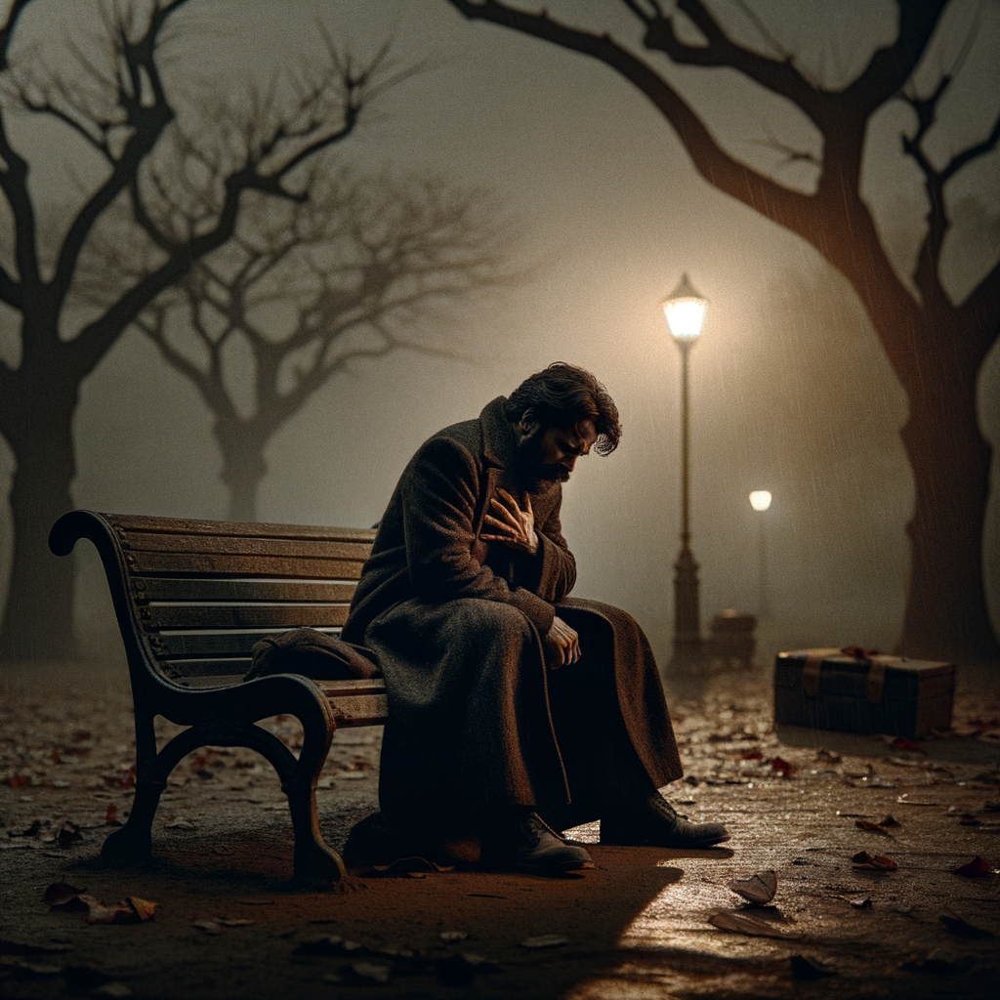

In [35]:
Image.open(test_df['img_path'][0])

In [36]:
output_text[0], label_text[0]

('\nThe Hindi proverb \'फिर पराजिया होना\' translates to "to come back to life" in English. It is often used to describe a situation where someone or something appears to be dead or lost, but then revives or recovers. The image should depict a scene where a person or object appears to be in a state of decay or loss, but then revives or recovers.\n\nThe image should show a barren, lifeless landscape with cracked and dry soil, representing the state of decay or loss. A person, symbolizing the revival or recovery, should be shown walking towards the scene, with a sense of hope and renewal. The person could be carrying a seed or a sapling, representing the potential for growth and renewal. The visual representation should convey the idea of hope and renewal, where something that seemed lost or dead can come back to life.',
 'Certainly! I\'ll refine the visualization to make it more specific and clear:\n\nThe proverb \'सब्जबाग दिखाना\' translates to "showing green gardens" in English. It me

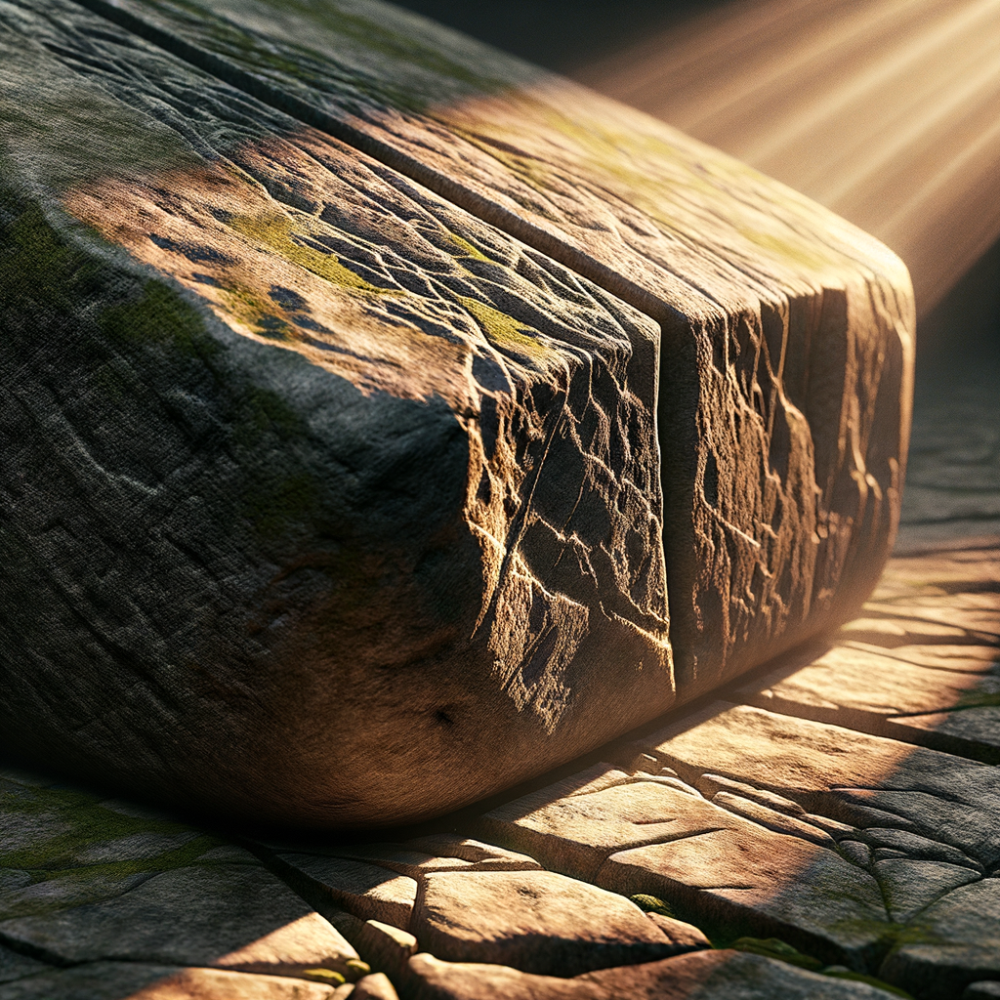

In [39]:
Image.open(test_df['img_path'][1])

In [40]:
output_text[1], label_text[1]

('\nThe Hindi proverb \'माँ का काँटा होना\' translates to "to have a mother\'s face" in English. It describes a situation where someone is extremely angry or furious, often to the point of being uncontrollable. The image should depict a person with a fierce, intense expression, possibly with their eyes bulging and their face contorted in rage. The background could feature a fiery or stormy sky, representing the intense emotions and turmoil associated with the proverb. The person could be holding their fists up, symbolizing their unbridled anger and determination to confront the situation head-on.',
 'The Hindi proverb \'ताव आना\' translates to "to get heated" or "to get angry" in English. It describes a situation where someone becomes very angry or agitated. For an image representation, you might depict a person with a deep red, flushed face and eyebrows furrowed in a scowl, standing in a tense posture with clenched fists. The person should have exaggerated steam clouds billowing out f

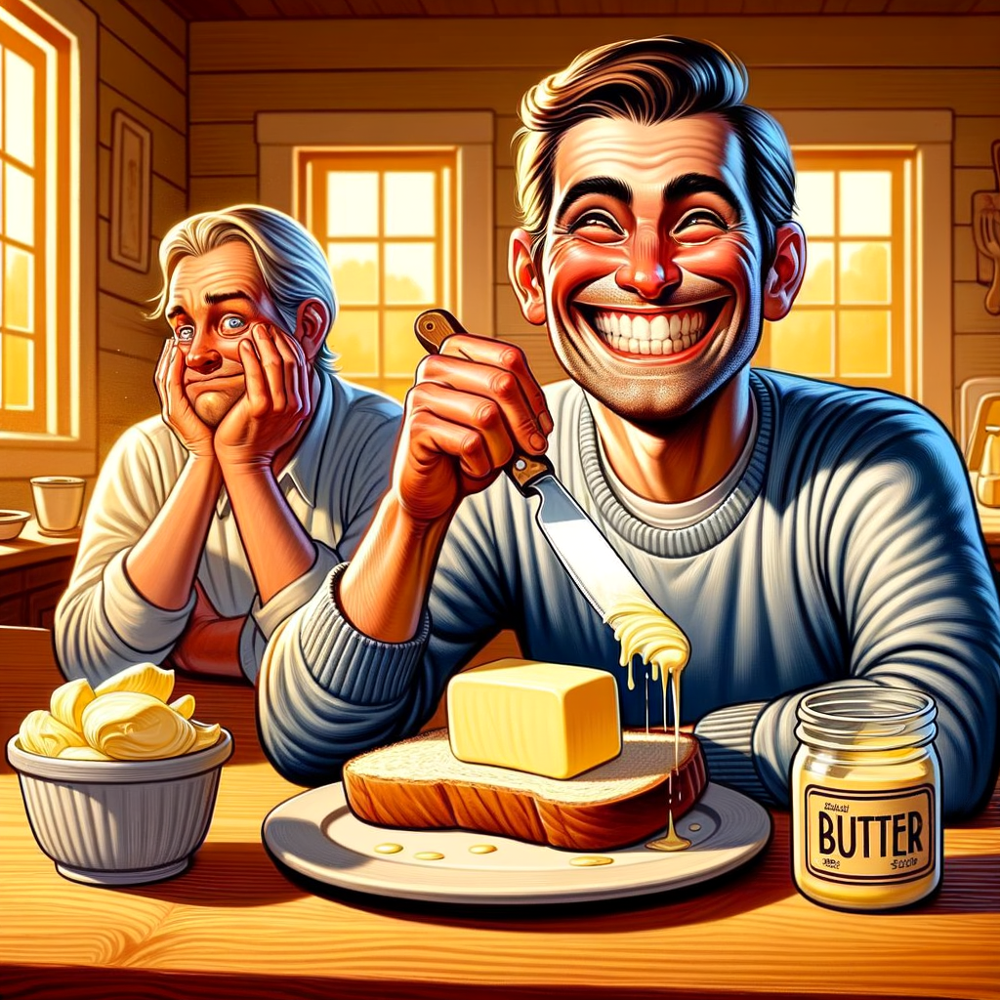

In [37]:
Image.open(test_df['img_path'][2])

In [38]:
output_text[2], label_text[2]

('\nThe Hindi proverb \'देख देख देख देख देख\' translates to "to look closely" or "to observe carefully" in English. It signifies the act of paying close attention to something, often to understand its true nature or to discern its details.\n\nTo visually represent this proverb, imagine an image of a person holding a pair of binoculars or a magnifying glass, with a clear and focused expression on their face. The person could be standing in a desert or a mountainous area, where the visual details of the landscape are particularly striking. The image should convey the idea of someone carefully examining something, with a sense of determination and attention to detail.',
 'The Hindi proverb \'दृष्टि फिरना\' translates to "a change in perspective" or "a shift in focus" in English. It signifies a situation where someone\'s viewpoint or attitude towards something or someone changes, often leading to a different understanding or behavior. This change can be due to new information, experiences,

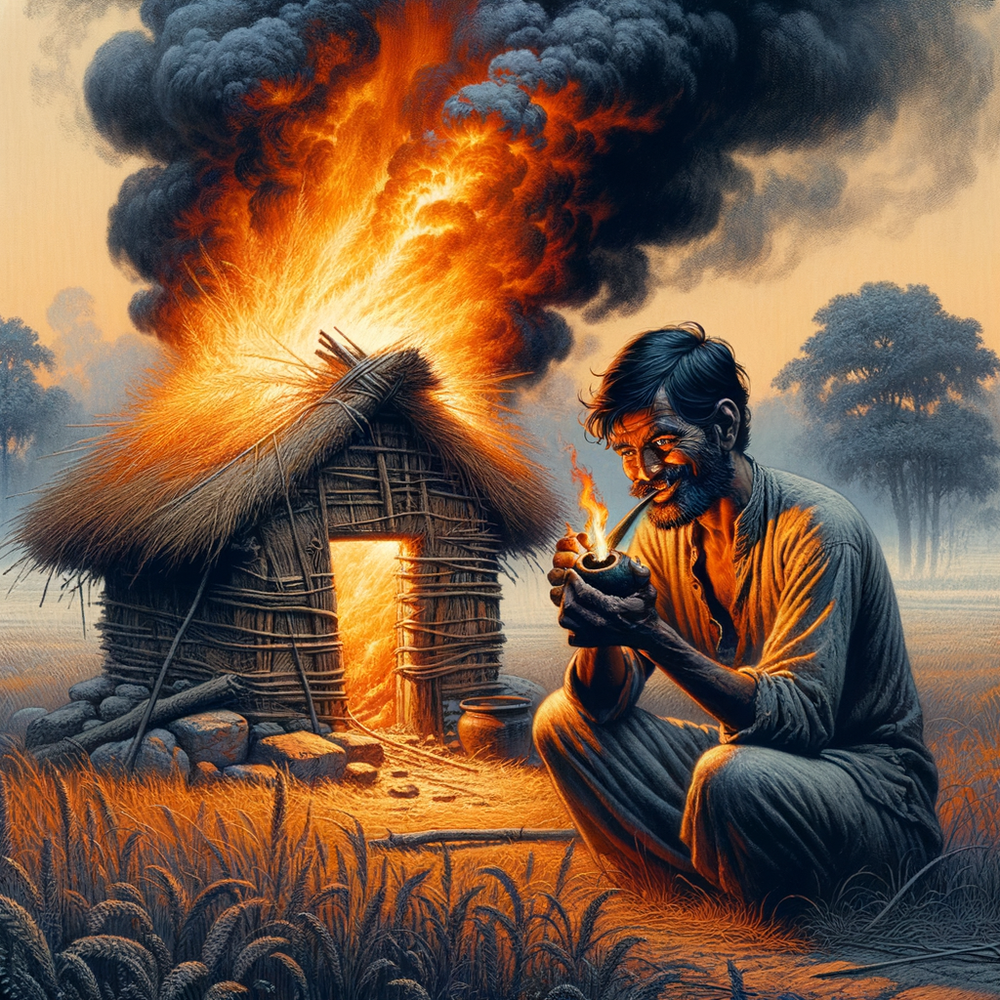

In [41]:
Image.open(test_df['img_path'][3])

In [42]:
output_text[3], label_text[3]

("\nThe Hindi proverb 'माँ का उलटा हाथ' translates to 'a mother's open hand' in English. It is often used to describe a mother's unwavering support, protection, and care for her children. The image should depict a mother figure, such as a woman or a mother cow, standing in a stormy or turbulent environment, holding an umbrella to shield herself and her child from the elements. The umbrella should be open and held firmly, symbolizing the mother's unwavering support and protection. The stormy or turbulent environment should be visually represented through lightning, strong winds, or heavy rain, emphasizing the mother's unwavering presence and care for her child in the face of adversity.",
 "The Hindi proverb 'बरस पड़ना' translates to 'to rain heavily' in English. It is often used metaphorically to describe a sudden and intense outpouring of emotions, actions, or events. For example, it can refer to someone suddenly expressing their anger or emotions very strongly, or a situation where som

## bleu, rouge, bertscore, meteor score

In [32]:
# from datasets import load_metric
import evaluate
import numpy as np
from nltk.translate.meteor_score import single_meteor_score  # Import METEOR
from tqdm.auto import tqdm

# Load the metrics
bleu = evaluate.load("bleu")
rouge = evaluate.load("rouge")
bertscore = evaluate.load("bertscore")

# Function to compute BLEU
def compute_bleu(predictions, references):
    result = bleu.compute(predictions=predictions, references=references)
    return result["bleu"]

# Function to compute ROUGE
def compute_rouge(predictions, references):
    result = rouge.compute(predictions=predictions, references=references)
    return result

# Function to compute BERTScore
def compute_bertscore(predictions, references):
    result = bertscore.compute(predictions=predictions, references=references, model_type="bert-base-uncased")
    return np.mean(result["f1"])
    
# Function to compute METEOR
def compute_meteor(predictions, references):
    tokenized_preds = [pred.split() for pred in predictions]
    tokenized_refs = [ref[0].split() for ref in references]
    meteor_scores = [single_meteor_score(ref, pred) for ref, pred in zip(tokenized_refs, tokenized_preds)]
    return np.mean(meteor_scores)

# Example evaluation function
def evaluate_model(predictions, references):
    refs_new = [[r] for r in references]
    
    # Compute metrics
    bleu_score = compute_bleu(predictions, refs_new)
    rouge_scores = compute_rouge(predictions, refs_new)
    bert_score = compute_bertscore(predictions, refs_new)
    meteor_score = compute_meteor(predictions, refs_new)
    
    super_txt = f"""BLEU Score: {bleu_score:.4f}
    ROUGE1 Scores: {rouge_scores['rouge1']}
    ROUGE2 Scores: {rouge_scores['rouge2']}
    ROUGEL Scores: {rouge_scores['rougeL']}
    ROUGELsum Scores: {rouge_scores['rougeLsum']}
    BERTScore (F1): {bert_score:.4f}
    METEOR Score: {meteor_score:.4f}"""
    print(super_txt)   # Display results
    
    f = open("art_videollava_vlm/inference.txt", "a")
    f.write(super_txt)
    f.close()

In [33]:
evaluate_model(op_lis, lb_lis)

BLEU Score: 0.0688
    ROUGE1 Scores: 0.38546193179830784
    ROUGE2 Scores: 0.10666020800453123
    ROUGEL Scores: 0.24494855048668374
    ROUGELsum Scores: 0.2626634836526012
    BERTScore (F1): 0.6201
    METEOR Score: 0.2234


In [72]:
evaluate_model(op_lis, lb_lis)

test eval: 100%|██████████| 157/157 [1:40:59<00:00, 38.60s/it] 
/home/sarmistha/miniconda3/envs/try_env/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


BLEU Score: 0.0912
ROUGE1 Scores: 0.3310659340515199
ROUGE2 Scores: 0.11762284824842972
ROUGEL Scores: 0.25757260243284685
ROUGELsum Scores: 0.2611727565914476
BERTScore (F1): 0.5990
METEOR Score: 0.2160


## old styles

In [31]:
from tqdm import tqdm

def generate_predictions(model, dataset, processor):
    predictions = []
    references = []
    model.eval()
    for item in tqdm(dataset, desc="Generating predictions"):
        with torch.no_grad():
            inputs = {k: v.unsqueeze(0).to(model.device) for k, v in item.items() if k != 'labels'}
            generated_ids = model.generate(**inputs, max_length=513)
            generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
            reference_text = processor.batch_decode(item['labels'].unsqueeze(0), skip_special_tokens=True)[0]
            
            predictions.append(generated_text)
            references.append(reference_text)
    return predictions, references

def calculate_rouge_scores(predictions, references):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = {
        'rouge1': [],
        'rouge2': [],
        'rougeL': []
    }
    for pred, ref in zip(predictions, references):
        score = scorer.score(ref, pred)
        for key in scores:
            scores[key].append(score[key].fmeasure)
    
    avg_scores = {key: sum(values) / len(values) for key, values in scores.items()}
    return avg_scores

def calculate_bleu_score(predictions, references):
    smoothie = SmoothingFunction().method4
    bleu_scores = []
    for pred, ref in zip(predictions, references):
        pred_tokens = pred.split()
        ref_tokens = [ref.split()]
        bleu_scores.append(sentence_bleu(ref_tokens, pred_tokens, smoothing_function=smoothie))
    avg_bleu = sum(bleu_scores) / len(bleu_scores)
    return avg_bleu

In [ ]:
video_dir = '/home/sarmistha/Research/videos'

test_dataset = VideoTextDataset(video_dir, test_df)
test_dataset[0]

In [ ]:
predictions, references = generate_predictions(model, test_dataset, processor) # still error

In [ ]:
with torch.no_grad():
    inputs = {k: v.unsqueeze(0).to(model.device) for k, v in test_dataset[0].items() if k != 'labels'}
    print(inputs)
    generated_ids = model.generate(**inputs, max_length=1024)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    reference_text = processor.batch_decode(item['labels'].unsqueeze(0), skip_special_tokens=True)[0]

generated_text, reference_text

In [ ]:
import sys
import os
import pandas as pd
sys.path.append('./')
from videollama2 import model_init, mm_infer
from videollama2.utils import disable_torch_init

def run_inference_for_csv(infer_df, video_directory, model_path, output_csv):
    disable_torch_init()

    # Load the CSV file
    data = infer_df.copy()

    # Initialize model, processor, and tokenizer
    model, _, tokenizer = model_init(model_path)

    # Check if output CSV exists
    if os.path.exists(output_csv):
        # Load already processed results if output CSV exists
        processed_data = pd.read_csv(output_csv)
        processed_ids = set(processed_data['ID'].tolist())
    else:
        # If output CSV does not exist, initialize an empty DataFrame
        processed_data = pd.DataFrame(columns=['ID', 'Text', 'Output'])
        processed_ids = set()

    # Iterate through each row in the CSV
    for index, row in data.iterrows():
        video_id = row['ID']  # Assuming 'ID' is the column with video IDs
        question = row['Text']  # Assuming 'Text' is the column with the instruction
        video_path = os.path.join(video_directory, f"{video_id}.mp4")
        print(index)
        # Skip already processed videos
        if video_id in processed_ids:
            print(f"Skipping already processed video: {video_id}")
            continue

        # Check if the video file exists
        if os.path.exists(video_path):
            print(f"Processing video: {video_path} with instruction: {question}")
            print(index)
            # Run inference
            output = mm_infer(processor['video'](video_path), question, model=model, tokenizer=tokenizer, do_sample=False, modal='video')

            # Append the result to the processed data
            result = pd.DataFrame({'ID': [video_id], 'Text': [question], 'Output': [output]})
            processed_data = pd.concat([processed_data, result], ignore_index=True)
        else:
            print(f"Video {video_path} does not exist")
            result = pd.DataFrame({'ID': [video_id], 'Text': [question], 'Output': ['Video not found']})
            processed_data = pd.concat([processed_data, result], ignore_index=True)

        # Save the updated results to the CSV file after each iteration
        processed_data.to_csv(output_csv, index=False)

    print(f"Results saved to {output_csv}")

def main():
    # File paths
    
    infer_df = test_df
    video_directory = '/home/sarmistha/Research/videos'  # Directory where videos are stored
    model_path = 'zera09/video_llava_qlora'  # Path to the model
    output_csv = '/home/sarmistha/Research/My_try/LLaVA-Video_inference.csv'  # Path to save the output CSV file

    # Run the inference for the entire CSV
    run_inference_for_csv(infer_df, video_directory, model_path, output_csv)

if __name__ == "__main__":
    main()


In [37]:
import numpy as np

np.linspace(0, 48, 2), np.linspace(0, 48, 1)

(array([ 0., 48.]), array([0.]))